In [ ]:
import os
import operator
import random

In [ ]:
import pandas as pd 
import numpy as np


In [ ]:
from pandas import json_normalize
import json

In [ ]:
import io

In [ ]:
from visions.functional import cast_to_inferred, detect_type, infer_type

In [ ]:
from visions.typesets import StandardSet

typeset = StandardSet()
typeset.types

{Boolean,
 Categorical,
 Complex,
 DateTime,
 Float,
 Generic,
 Integer,
 Object,
 String,
 TimeDelta}

In [ ]:
import plotly.express as px


In [ ]:
import seaborn as sb
sb.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
import datetime

In [ ]:
#While using google colab        
from google.colab import files

uploaded = files.upload()


Saving datasets_35901_52633_winequalityN.csv to datasets_35901_52633_winequalityN.csv


In [ ]:
#Getting the filename
filename= str(list(uploaded.keys())[0])

In [ ]:
#Getting the file extension
file_extension = os.path.splitext(filename)[1]

**Converting the dataset into Tabular form**

In [ ]:
  def xml2df(xml_data):
      root = ET.XML(xml_data) # element tree
      all_records = []
      for i, child in enumerate(root):
          record = {}
          for subchild in child:
              record[subchild.tag] = subchild.text
          all_records.append(record)
      df = pd.DataFrame(all_records)
      

      return df

In [ ]:
  def xml2dfHeader(xml_data):
      root = ET.XML(xml_data) # element tree
      all_records = []
      for i, child in enumerate(root):
          record = {}
          for subchild in child:
              record[subchild.tag] = subchild.text
          all_records.append(record)
      df = pd.DataFrame(all_records, header = False)     

      return df

In [ ]:
flag = 0
flag_head = 0
#convert csv file
if file_extension == ".csv":

  data = pd.read_csv(io.BytesIO(uploaded[filename]),sep = None, engine = 'python')
  data_nohead = pd.read_csv(io.BytesIO(uploaded[filename]),sep = None, engine = 'python', header = None)
  flag_head = 1

elif file_extension == ".xml":
  
  pd.set_option('display.max_columns', None)

  # load XML to dataframe 
  xml_data = open(filename).read()
  data = xml2df(xml_data)
  data_nohead = xml2dfHeader(xml_data)
  flag_head = 1
  
#convert excel file
elif (file_extension == ".xls") | (file_extension == ".xlsx"):
  data = pd.read_excel(filename, comment='#')
  data_nohead = pd.read_excel(filename, comment = '#', header=None)
  flag_head = 1
  
#convert json file
elif (file_extension == ".json") :

  data = pd.read_json(filename)

else:

  flag = 1

  print("Sorry we do not support this format")

## Handling Header

In [ ]:
def has_header(nrows=20):
  if flag_head == 0:
    return True
  else:
    data1 = data_nohead.head(nrows)
    data2 = data.head(nrows)
    return (tuple(data1.dtypes) != tuple(data2.dtypes))

In [ ]:
hasheader = has_header()
print(hasheader)

True


In [ ]:
feature_rename = []
if hasheader == False:
  total = data.shape[1]
  for i in range(total):
    columnNumber = i + 1
    x = "Enter the name of column " +  str(columnNumber) +": "
    nameInput = input(x)
    feature_rename.append(str(nameInput))
  data.columns=feature_rename


**Handling Datatype**

In [ ]:
if flag == 0:
  
  data_type_sam = {}
  row=data.shape[0]
  data_sam = data.sample(int(row/10))

  #First Sample for the initialization of main dictionary
  for (columnName, columnData) in data_sam.iteritems():

    data_type_sam[columnName] = {str(infer_type(data_sam[columnName], typeset)):1}

  #Taking sample for 10 times for accuracy
  for i in range(9):

    data_sam = data.sample(int(row/10))

    for (columnName, columnData) in data_sam.iteritems():

      dataTypeValue = str(infer_type(data_sam[columnName], typeset))

      if data_type_sam[columnName].__contains__(dataTypeValue):

        data_type_sam[columnName][str(infer_type(data_sam[columnName], typeset))] += 1

      else:
        
        data_type_sam[columnName][dataTypeValue] = 1


  print(data_type_sam)


{'type': {'String': 10}, 'fixed acidity': {'Float': 10}, 'volatile acidity': {'Float': 10}, 'citric acid': {'Float': 10}, 'residual sugar': {'Float': 10}, 'chlorides': {'Float': 10}, 'free sulfur dioxide': {'Float': 10}, 'total sulfur dioxide': {'Float': 5, 'Integer': 5}, 'density': {'Float': 10}, 'pH': {'Float': 10}, 'sulphates': {'Float': 10}, 'alcohol': {'Float': 10}, 'quality': {'Integer': 10}}


In [ ]:
data_type = {}

if flag == 0:
#Making a dictionary with the datatype with maximum rate
  for (columnName, columnData) in data_sam.iteritems():

    max_value = max(data_type_sam[columnName].items(), key=operator.itemgetter(1))[0]

    data_type[columnName] = max_value

  print(data_type)

{'type': 'String', 'fixed acidity': 'Float', 'volatile acidity': 'Float', 'citric acid': 'Float', 'residual sugar': 'Float', 'chlorides': 'Float', 'free sulfur dioxide': 'Float', 'total sulfur dioxide': 'Float', 'density': 'Float', 'pH': 'Float', 'sulphates': 'Float', 'alcohol': 'Float', 'quality': 'Integer'}


In [ ]:
#Changing the datatype
if flag == 0:

  change = []
  
  for (columnName, columnData) in data.iteritems():

    if data_type[columnName] ==  'DateTime':

      data_type_before = str(detect_type(data[columnName],typeset))

      data[columnName] = pd.to_datetime(data[columnName], errors = 'coerce')

      if data_type_before != str(detect_type(data[columnName],typeset)):

        print(columnName, " column data was changed from ", data_type_before , " to ", str(detect_type(data[columnName],typeset)))


    elif (data_type[columnName] ==  'Integer') or (data_type[columnName] ==  'Float'):

      data_type_before = str(detect_type(data[columnName],typeset))

      data[columnName] = pd.to_numeric(data[columnName], errors = 'coerce')

      if data_type_before != str(detect_type(data[columnName],typeset)):

        print(columnName, " column data was changed from ", data_type_before , " to ", str(detect_type(data[columnName],typeset)))

      
    elif data_type[columnName] ==  'TimeDelta':

      data_type_before = str(detect_type(data[columnName],typeset))

      data[columnName] = pd.to_timedelta(data[columnName], errors = 'coerce')

      if data_type_before != str(detect_type(data[columnName],typeset)):

        print(columnName, " column data was changed from ", data_type_before , " to ", str(detect_type(data[columnName],typeset)))

    else:

      data[columnName] = data[columnName]

**Handling Duplicates**

In [ ]:
if flag == 0:
  before = data.shape[0] 
  bool_series = data.duplicated(keep='last')
    
  # bool series 
  bool_series 
    
  # passing NOT of bool series to see unique values only 
  data = data[~bool_series] 
  after = data.shape[0]

  data_drop = before - after 

**Handling Missing Values** 

In [ ]:
if flag == 0:

  #Finding the number of missing data
  before = data.shape[0]
  data_copy = data.copy()
  data_copy.dropna(inplace = True)
  after = data_copy.shape[0]
  null_data = before - after

  print("There are altogether ", null_data, "in the dataset.")

  #options for handling missing data
  
  percent_missing = data.isnull().sum() * 100 / len(data)
  for (colName,colValue) in data.iteritems():
    if percent_missing[colName] >= 40:
      data = data.drop([colName], axis=1)
      print(colName, " column was dropped.")
  
  for (colName,colValue) in data.iteritems():
      #Filling the missing value with median for only numerical columns
      type_of_column = str(detect_type(data[colName],typeset))
      if (type_of_column == "Integer") or (type_of_column == "Float"):
        med = data[colName].median()
        data[colName] = data[colName].fillna(med)

  data = data.dropna()

  after = data.shape[0]

  dropped_rows = before - after
  print(dropped_rows, " rows were dropped.")
  
      

There are altogether  34 in the dataset.
0  rows were dropped.


In [ ]:
data.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
6,white,6.2,0.32,0.16,7.00,0.045,30.0,136.0,0.9949,3.18,0.47,9.6,6
9,white,8.1,0.22,0.43,1.50,0.044,28.0,129.0,0.9938,3.22,0.45,11.0,6
10,white,8.1,0.27,0.41,1.45,0.033,11.0,63.0,0.9908,2.99,0.56,12.0,5
11,white,8.6,0.23,0.40,4.20,0.035,17.0,109.0,0.9947,3.14,0.53,9.7,5
12,white,7.9,0.18,0.37,1.20,0.040,16.0,75.0,0.9920,3.18,0.63,10.8,5


# Visualization

## Single Variate

In [ ]:
#Numerical
def HistChart(colnum):
  title_plot = "Histogram of "+colnum
  fig = px.histogram(data, x = colnum, title=title_plot, labels={colnum:colnum})
  fig.update_xaxes(tickangle=70)
  fig.show()

In [ ]:
def PieChart(colcat):
    labels = data[colcat].value_counts().index
    values = data[colcat].value_counts().values
    fig = px.pie(values = values, names = labels, title="Pie Chart of "+ colcat)
    fig.show()


## Bivariate

In [ ]:
#Numerical
def ViolinChartsecond(colcat,colnum):
  fig = px.violin(data, y=colnum, x=colcat, box=True, color = colcat, points="all", title = "Violin Plot between "+ colcat + " and "+ colnum)
  fig.update_xaxes(tickangle=70)
  fig.show()

In [ ]:
#DateTime vs Numerical
def LineChart(colDate,colnum):
  year_name = colDate+'_year'
  data[year_name] = pd.DatetimeIndex(data[colDate]).year
  title = 'Line Chart between ' + str(colDate) + ' and ' + str(colnum)
  fig = px.line(data, x=year_name, y=colnum, title=title)
  fig.show()

## Multivariate

In [ ]:
def ScatterChartThree(colcat,colnum1,colnum2):
    plt.figure(figsize=[10,6])
    ax = sb.scatterplot(data=data, x=colnum1,
                    y=colnum2, hue=colcat)
    ax.legend(loc=1, ncol=3, framealpha=1 )
    plt.title("Scatter Plot between "+ colcat + ", "+ colnum1 + " and "+ colnum2)
    plt.xticks(rotation=70)
    plt.show()

In [ ]:
def BarChartThree(colcat1,colcat2,colnum):
  if data[colcat1].nunique() < 4:
    plt.figure(figsize=[10,6])
    ax = sb.boxplot(data=data, x=colcat2,
                    y=colnum, hue=colcat1)
    ax.legend(loc=1, ncol=3, framealpha=1, title= colcat1 )
    plt.title("Box Plot between "+ colcat1 + ", "+ colcat2 + " and "+ colnum)
    plt.xticks(rotation=70)
    plt.show()

In [ ]:
cat_col = []

In [ ]:
date_col = []

### Plotting single variant plot


In [ ]:
for (columnName, columnData) in data.iteritems():
  if (data_type[columnName] == "Integer") or (data_type[columnName] == "Float"):
    HistChart(columnName)    
  if (data_type[columnName] == "String") or (data_type[columnName] == "Boolean"):
    if (data_type[columnName] == "Boolean"):
      PieChart(columnName)
    if (data.shape[0] < 1000) and (data[columnName].nunique() <= data.shape[0]*0.01):
      cat_col.append(columnName)      
      PieChart(columnName)
    elif(data.shape[0] > 1000) and (data[columnName].nunique() <= 20):
      cat_col.append(columnName)
      PieChart(columnName)
  if data_type[columnName] == "DateTime":
    date_col.append(columnName)


## Plotting bivariant plot

In [ ]:
for i in cat_col:
  for (columnName, columnData) in data.iteritems():
    if (data_type[columnName] == "integer") or (data_type[columnName] == "Float"):
      ViolinChartsecond(i,columnName)


In [ ]:
for i in date_col:
  for (columnName, columnData) in data.iteritems():
    if (data_type[columnName] == "integer") or (data_type[columnName] == "Float"):
      LineChart(i,columnName)
      

## Plotting Multivariant


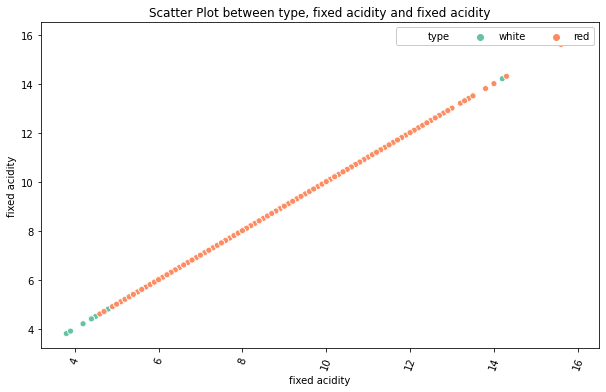

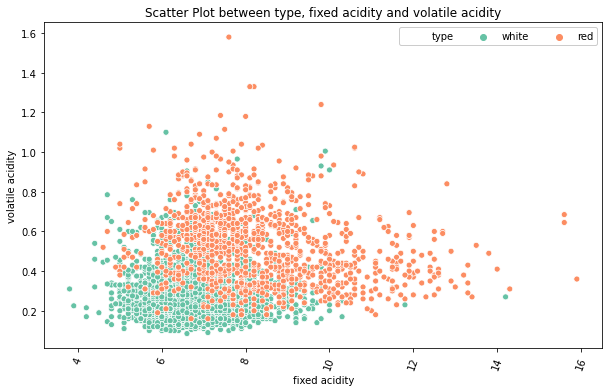

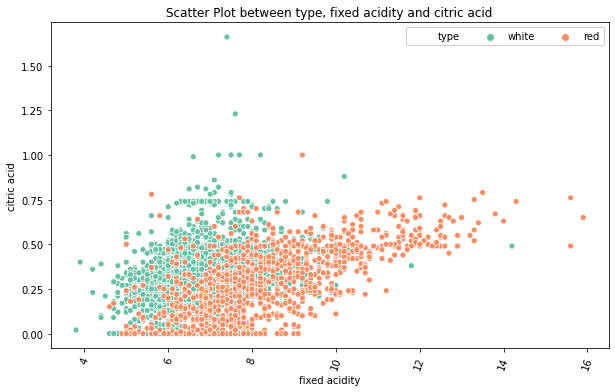

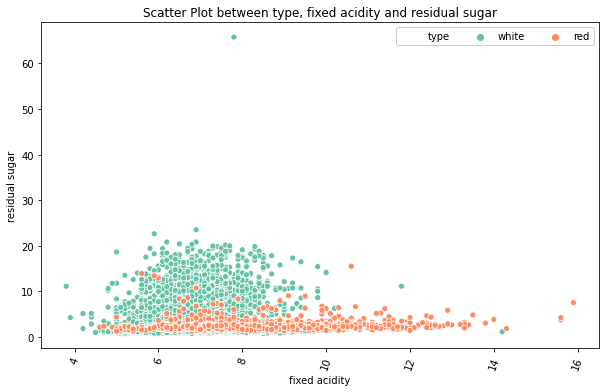

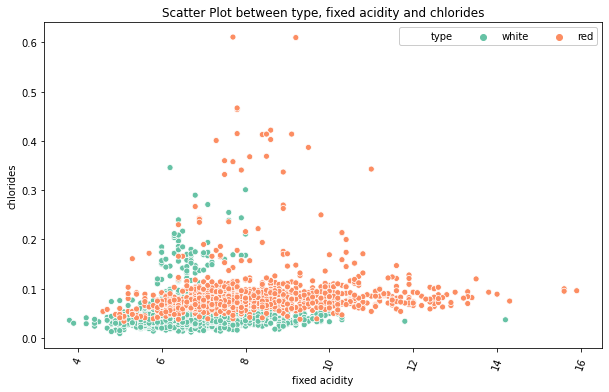

...

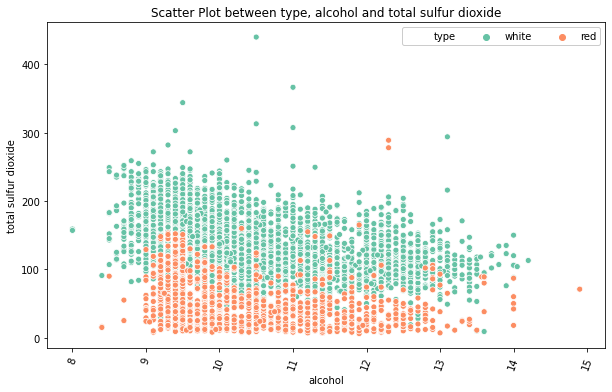

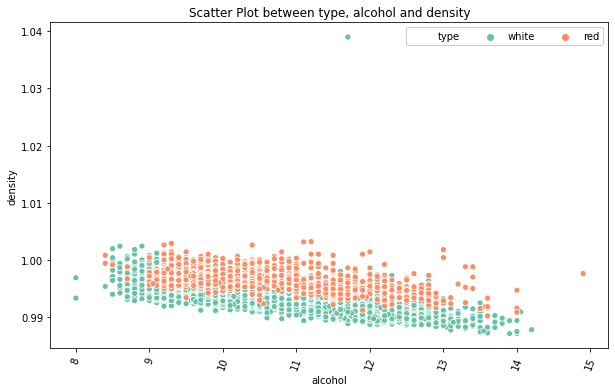

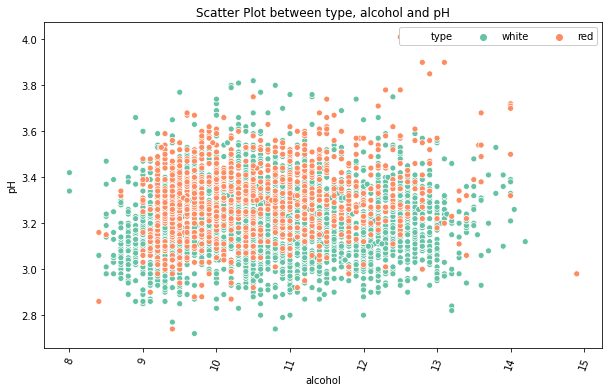

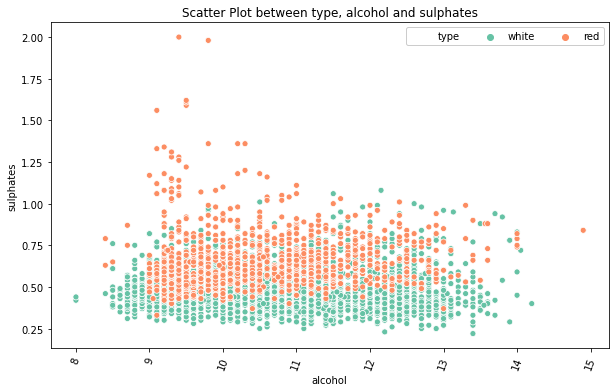

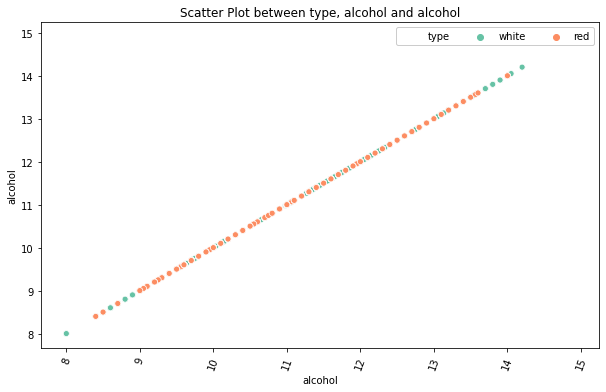

In [ ]:
for i in cat_col:
  for (columnName1, columnData) in data.iteritems():
    if (data_type[columnName1] == "integer") or (data_type[columnName1] == "Float"):
      for (columnName2, columnData) in data.iteritems():
        if (data_type[columnName2] == "integer") or (data_type[columnName2] == "Float"):
          ScatterChartThree(i,columnName1,columnName2)

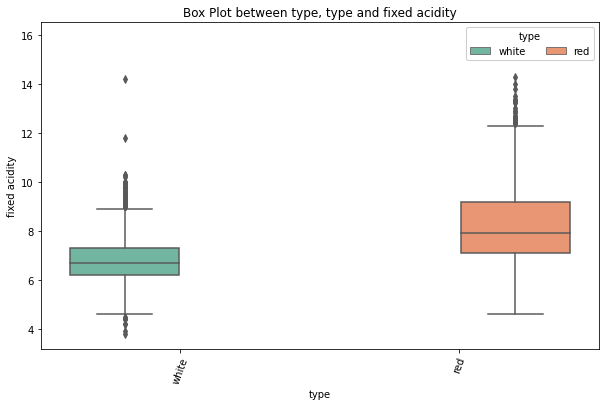

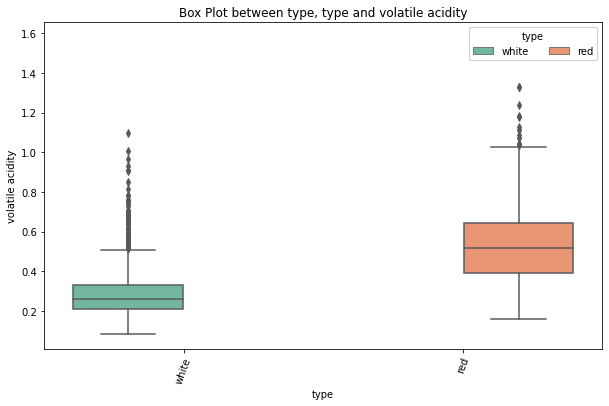

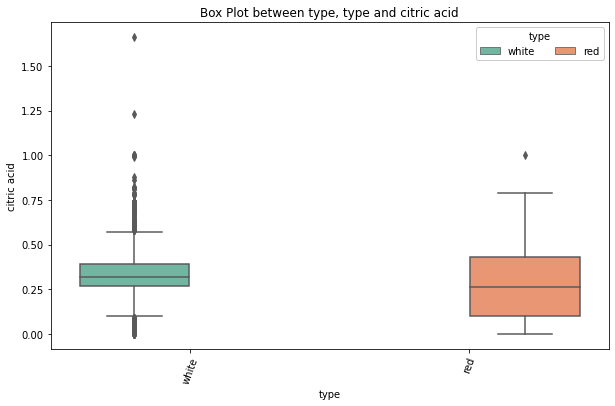

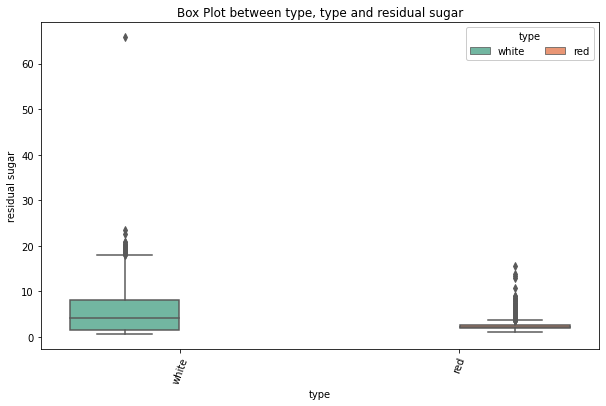

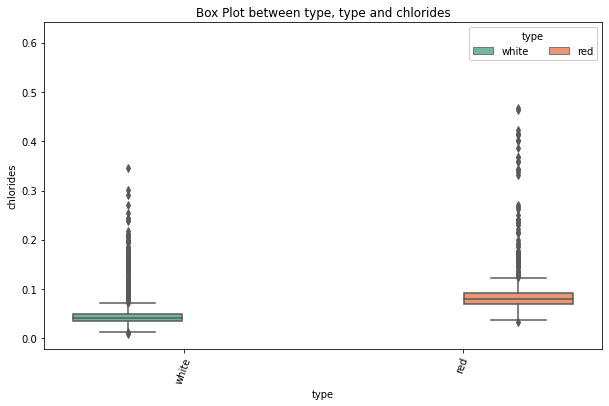

...

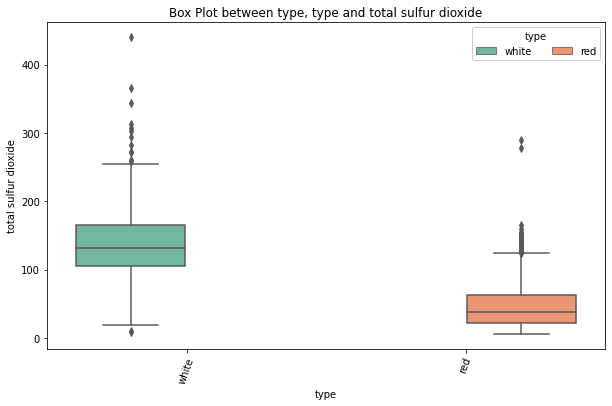

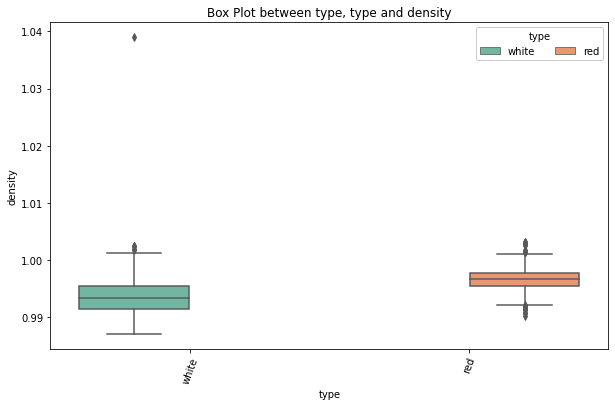

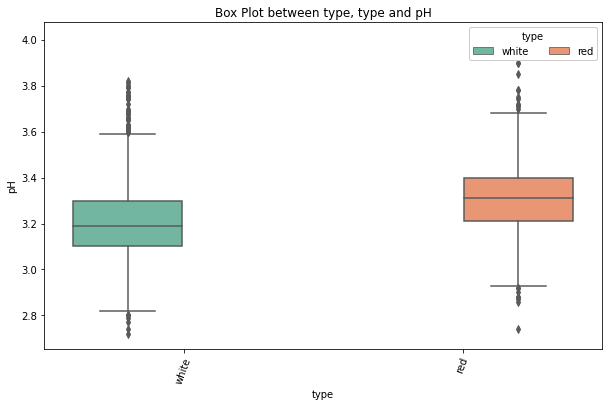

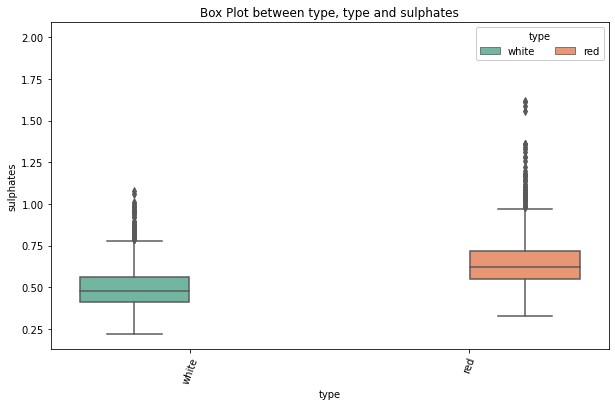

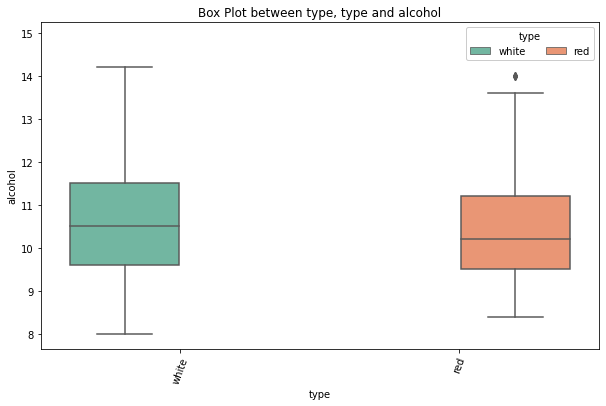

In [ ]:
for i1 in cat_col:
  for i2 in cat_col:
    for (columnName, columnData) in data.iteritems():
        if (data_type[columnName] == "integer") or (data_type[columnName] == "Float"):
          BarChartThree(i1,i2,columnName)